##Importing Libraries

In [1]:
import torch
import torch.nn as NeuralNet
import torch.nn.functional as funct
from torch.autograd import Variable
import torch.utils.data as utils
import torch.utils.data as td
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_iris
from matplotlib import pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
import numpy as np
from numpy import dot
from numpy.linalg import norm
from queue import PriorityQueue

##Defining neural network and its components

In [2]:
class neural_network(NeuralNet.Module):
    
    #h1 and h2 represent the two hidden layers of our network
    #Tanh is the activation function used
    def __init__(self, numoffeatures, h1, h2,output):
        super(neural_network, self).__init__()
        self.first   = NeuralNet.Linear(numoffeatures, h1)
        self.tanh1 = NeuralNet.Tanh()
        self.second   = NeuralNet.Linear(h1, h2)
        self.tanh2 = NeuralNet.Tanh()
        self.third   = NeuralNet.Linear(h2, output)    

    def forward(self, x):
        out = self.first(x)
        out = self.tanh1(out)
        out = self.second(out)
        out = self.tanh2(out)
        out = self.third(out)
        
        return out

##Defining important parameters


In [3]:
lr = 0.01 
#this will make the first layer of our network
numoffeatures = 4 
#number of nodes in 1st and 2nd hidden layers
h1 = 10
h2 = 5
#this will be last layer of our network
numofclasses = 3
#num of iterations for which we want to backpropagate
epochs = 25

##Implementing the Model

In [4]:
m = neural_network(numoffeatures,h1,h2,numofclasses)

#choosing optimizer and desired loss function
criterion = NeuralNet.CrossEntropyLoss()
#Adam Algorithm is an algorithm for stochastic optimization
optimizer = torch.optim.Adam(m.parameters(), lr=lr)

##Getting the dataset and splitting it

In [5]:
#load dataset
ds = load_iris()
x , y = ds.data, ds.target
#splitting into train and test as 0.8 and 0.2
x_train , x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=1)
#splitting test into test and validation as 0.1 and 0.1
x_test , x_val , y_test , y_val = train_test_split(x_test, y_test, test_size=0.5, random_state=1)

##Creating datasets and loaders for train, validation and test data

In [6]:
#getting tensors

#Train
x_train_tnsr = torch.Tensor(x_train).float()
y_train_tnsr = torch.Tensor(y_train).long()

ds_train_tnsr = utils.TensorDataset(x_train_tnsr,y_train_tnsr)

train_data_loader = td.DataLoader(ds_train_tnsr, batch_size=10, shuffle=True, num_workers=1)

#Validation
x_val_tnsr = torch.Tensor(x_val).float()
y_val_tnsr = torch.Tensor(y_val).long()
ds_val_tnsr = utils.TensorDataset(x_val_tnsr,y_val_tnsr)
val_data_loader = td.DataLoader(ds_val_tnsr, batch_size=10, shuffle=True, num_workers=1)

#Test
x_test_tnsr = torch.Tensor(x_test).float()
y_test_tnsr = torch.Tensor(y_test).long()

ds_test_tnsr = utils.TensorDataset(x_test_tnsr,y_test_tnsr)

test_data_loader = td.DataLoader(ds_test_tnsr, batch_size=10, shuffle=True, num_workers=1)

##Function to get train loss and validation loss

In [7]:
def train(model, loader, loader1, criterion, optimizer):
    
    model.train()
    
    t_loss = 0
    v_loss = 0
    
    for b, tnsr in enumerate(loader):
        curr_data, curr_target = tnsr
        #setting gradients to zero
        optimizer.zero_grad()
        next = model(curr_data)
        loss = criterion(next, curr_target)
        #calculating gradients
        loss.backward()
        #Updating weights
        optimizer.step()
        t_loss += loss.item()
    
    #evaluating our model
    model.eval()
    for b, tnsr in enumerate(loader1):
        curr_data, curr_target = tnsr
        next = model(curr_data)
        loss = criterion(next, curr_target)
        v_loss += loss.item()
        
        
    #Return loss
    avg_loss_t = t_loss / len(loader.dataset)
    avg_loss_v = v_loss / len(loader1.dataset)
    return avg_loss_t, avg_loss_v

##Function to get test loss

In [8]:
def test(model, loader, criterion):

    #evaluate model
    model.eval()

    t_loss = 0
    count = 0

    with torch.no_grad():
        for b, tnsr in enumerate(loader):
            curr_data, curr_target = tnsr

            #find answer by passing data through model
            output = model(curr_data)

            #find loss
            t_loss += criterion(output, curr_target).item()

            #find accuracy
            _, prediction = torch.max(output, 1)
            count += torch.sum(curr_target == prediction).item()


    avg_acc = count / len(loader.dataset)
    avg_loss = t_loss / len(loader.dataset)
    
    return avg_acc, avg_loss


##Using our model

In [9]:
enums = []
tr_losses = []
val_losses = []


for epoch in range(epochs):
    
    #train our model
    tr_loss, val_loss = train(m, train_data_loader, val_data_loader, criterion, optimizer)
    
    enums.append(epoch)
    tr_losses.append(tr_loss)
    val_losses.append(val_loss)
    print("Epoch ",epoch+1,":")
    print("Training Loss :",tr_loss," Validation Loss :",val_loss)


Epoch  1 :
Training Loss : 0.11043494294087092  Validation Loss : 0.13962940375010172
Epoch  2 :
Training Loss : 0.09614286720752716  Validation Loss : 0.12741331656773885
Epoch  3 :
Training Loss : 0.07543891419967015  Validation Loss : 0.10331085522969564
Epoch  4 :
Training Loss : 0.05762854690353076  Validation Loss : 0.08755773703257243
Epoch  5 :
Training Loss : 0.04631331140796344  Validation Loss : 0.07364566326141357
Epoch  6 :
Training Loss : 0.03830399985114733  Validation Loss : 0.05893575350443522
Epoch  7 :
Training Loss : 0.029833713298042616  Validation Loss : 0.051031259695688884
Epoch  8 :
Training Loss : 0.022628767291704814  Validation Loss : 0.05400635202725728
Epoch  9 :
Training Loss : 0.019209833443164827  Validation Loss : 0.027625330289204917
Epoch  10 :
Training Loss : 0.014578550308942794  Validation Loss : 0.03145942290623983
Epoch  11 :
Training Loss : 0.013592283179362615  Validation Loss : 0.02173994282881419
Epoch  12 :
Training Loss : 0.013127941607187

##Plotting and analysis

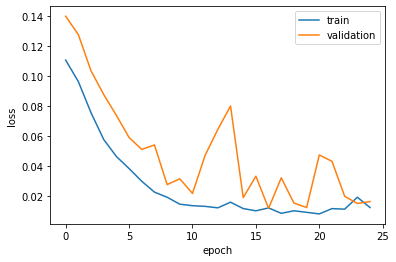

Accuracy : 100.0 % Test Loss:  0.0025202353795369466


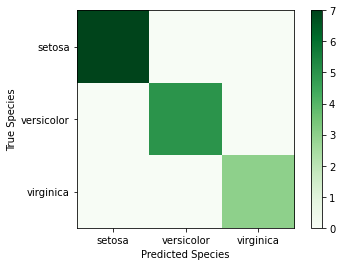

In [10]:
plt.plot(enums, tr_losses)
plt.plot(enums, val_losses)
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['train', 'validation'])
plt.show()

accuracy, tst_loss = test(m, test_data_loader, criterion)

print("Accuracy :",accuracy * 100,"% Test Loss: ",tst_loss)

#set model to evaluate mode
m.eval()

#get predictions
x = torch.Tensor(x_test).float()
_, predicted = torch.max(m(x).data, 1)

#Getting confusion matrix
k = accuracy_score(y_test, predicted.numpy())

cm = confusion_matrix(y_test, predicted.numpy())
plt.imshow(cm, interpolation="nearest", cmap=plt.cm.Greens)
plt.colorbar()
tick_marks = np.arange(len(ds.target_names))
plt.xticks(tick_marks, ds.target_names)
plt.yticks(tick_marks, ds.target_names)
plt.xlabel("Predicted Species")
plt.ylabel("True Species")
plt.show()


##Reading data from vectors.txt

In [11]:
with open('vectors.txt') as f:
    lines = f.readlines()

all_words = {}

for line in lines:
  #deleting last char '\n'
  line = line[:-1]
  #splitting at spaces
  line = line.split(" ")
  #taking word and vectors
  word = line[0]
  vector = line[1:]
  #converting vector coordinates to floats
  for i in range(len(vector)):
    vector[i] = float(vector[i])
  
  all_words[word] = vector

print("Done!")

Done!


##Function to get closest words

In [12]:
def get_20_closest(word):

    #converting word to lower case
    word = word.lower()
    #priority queue so we can pop the element with
    #smallest cosine when size exceeds 21
    q = PriorityQueue()
    for x in all_words:
        #calculate cosine
        cosine_sim = dot(all_words[x],all_words[word])/(norm(all_words[x])*norm(all_words[word]))
        q.put((cosine_sim,x))
        if(q.qsize() > 21):
          q.get()

    closest = []
    while(q.empty() is False):
      #converting it to list
      closest.append(np.asarray(q.get())[::-1])
      
    #converting it to dataframe
    closest = pd.DataFrame(closest[::-1],columns = ['Words','Cosine Similarity Index'])
    return closest

####Closest to 'life'

In [13]:
closest_to_life = get_20_closest('life')
closest_to_life

,Words,Cosine Similarity Index
0,life,1.0
1,mind,0.8514841863412058
2,love,0.8403438472391275
3,lives,0.8392689150907717
4,own,0.8369905081691961
5,kind,0.833887260989752
6,experience,0.8213189099822806
7,child,0.8168196357102483
8,perhaps,0.8082367683717586
9,she,0.8081038679210566


####Closest to 'market'

In [14]:
closest_to_market = get_20_closest('market')
closest_to_market

,Words,Cosine Similarity Index
0,market,1.0
1,markets,0.9401178795959132
2,prices,0.9033576157288118
3,stock,0.8850148480890682
4,buying,0.8556633834826431
5,consumer,0.8472994439921968
6,retail,0.8450345672257296
7,stocks,0.8400351280967209
8,price,0.8383353935418287
9,sales,0.8324212456959711


####Closest to 'Stanford'

In [15]:
closest_to_stanford = get_20_closest('Stanford')
closest_to_stanford

,Words,Cosine Similarity Index
0,stanford,1.0
1,ucla,0.8524495684262241
2,harvard,0.8466463005377866
3,yale,0.8393530271238332
4,princeton,0.8349352254305833
5,rutgers,0.8128204094909456
6,university,0.7906179668757196
7,baylor,0.7722881793675541
8,graduate,0.7668696881925167
9,georgetown,0.763642714665397


####Uncomment this and run with a valid input in order to find 20 closest words of that input

In [16]:
# closest_words_to_this = get_20_closest('*enter_word_present_in_vectors.txt_here*')
# closest_words_to_this

#Select GPU as runtime type in colab before running this



####TSNE visualization for all points

In [17]:
import pandas as pd

df = pd.DataFrame.from_dict(all_words, orient='index')
df = df[:-1]

In [18]:
df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49
the,0.418000,0.249680,-0.41242,0.121700,0.34527,-0.044457,-0.496880,-0.178620,-0.000660,-0.656600,0.278430,-0.147670,-0.55677,0.146580,-0.00951,0.011658,0.102040,-0.127920,-0.844300,-0.121810,-0.016801,-0.332790,-0.155200,-0.231310,-0.191810,-1.88230,-0.76746,0.099051,-0.421250,-0.19526,4.00710,-0.185940,-0.522870,-0.316810,0.000592,0.007445,0.177780,-0.158970,0.012041,-0.054223,-0.298710,-0.157490,-0.347580,-0.045637,-0.442510,0.187850,0.002785,-0.184110,-0.115140,-0.785810
",",0.013441,0.236820,-0.16899,0.409510,0.63812,0.477090,-0.428520,-0.556410,-0.364000,-0.239380,0.130010,-0.063734,-0.39575,-0.481620,0.23291,0.090201,-0.133240,0.078639,-0.416340,-0.154280,0.100680,0.488910,0.312260,-0.125200,-0.037512,-1.51790,0.12612,-0.024420,-0.042961,-0.28351,3.54160,-0.119560,-0.014533,-0.149900,0.218640,-0.334120,-0.138720,0.318060,0.703580,0.448580,-0.080262,0.630030,0.321110,-0.467650,0.227860,0.360340,-0.378180,-0.566570,0.044691,0.303920
.,0.151640,0.301770,-0.16763,0.176840,0.31719,0.339730,-0.434780,-0.310860,-0.449990,-0.294860,0.166080,0.119630,-0.41328,-0.423530,0.59868,0.288250,-0.115470,-0.041848,-0.679890,-0.250630,0.184720,0.086876,0.465820,0.015035,0.043474,-1.46710,-0.30384,-0.023441,0.305890,-0.21785,3.74600,0.004228,-0.184360,-0.462090,0.098329,-0.119070,0.239190,0.116100,0.417050,0.056763,-0.000064,0.068987,0.087939,-0.102850,-0.139310,0.223140,-0.080803,-0.356520,0.016413,0.102160
of,0.708530,0.570880,-0.47160,0.180480,0.54449,0.726030,0.181570,-0.523930,0.103810,-0.175660,0.078852,-0.362160,-0.11829,-0.833360,0.11917,-0.166050,0.061555,-0.012719,-0.566230,0.013616,0.228510,-0.143960,-0.067549,-0.381570,-0.236980,-1.70370,-0.86692,-0.267040,-0.258900,0.17670,3.86760,-0.161300,-0.132730,-0.688810,0.184440,0.005246,-0.338740,-0.078956,0.241850,0.365760,-0.347270,0.284830,0.075693,-0.062178,-0.389880,0.229020,-0.216170,-0.225620,-0.093918,-0.803750
to,0.680470,-0.039263,0.30186,-0.177920,0.42962,0.032246,-0.413760,0.132280,-0.298470,-0.085253,0.171180,0.224190,-0.10046,-0.436530,0.33418,0.678460,0.057204,-0.344480,-0.427850,-0.432750,0.559630,0.100320,0.186770,-0.268540,0.037334,-2.09320,0.22171,-0.398680,0.209120,-0.55725,3.88260,0.474660,-0.956580,-0.377880,0.208690,-0.327520,0.127510,0.088359,0.163510,-0.216340,-0.094375,0.018324,0.210480,-0.030880,-0.197220,0.082279,-0.094340,-0.073297,-0.064699,-0.260440
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
chanty,0.232040,0.025672,-0.70699,-0.045465,0.13989,-0.628070,0.726250,0.341080,0.446140,0.163290,0.159370,0.743780,1.11240,1.058400,-0.68263,-0.513390,0.450450,0.102060,-0.262060,0.133010,-0.758470,-0.230590,0.523570,-0.291490,0.367490,0.96233,0.25214,0.575340,0.408430,0.46418,-0.98081,-0.407000,0.379570,0.742780,-0.535810,0.042461,-0.588340,-0.635050,-0.966620,0.220570,-0.095526,-0.296050,0.385670,0.136840,0.593310,-0.694860,0.124100,-0.180690,-0.258300,-0.039673
kronik,-0.609210,-0.672180,0.23521,-0.111950,-0.46094,-0.007462,0.255780,0.856320,0.055977,-0.237920,0.067622,0.480530,-0.23417,-0.113490,-0.38991,0.025498,0.555260,-0.326640,0.088174,-0.100240,-0.401950,-0.056360,0.400480,0.210700,-0.032654,0.93335,0.97610,-0.077802,0.197780,0.13785,-1.19000,0.174760,0.494330,-0.047953,-0.442480,0.316300,0.041216,-0.216980,-0.488880,-0.485840,0.672050,-0.598220,-0.202590,0.392430,0.028873,0.030003,-0.106170,-0.114110,-0.249010,-0.120260
rolonda,-0.511810,0.058706,1.09130,-0.551630,-0.10249,-0.126500,0.995030,0.079711,-0.162460,0.564880,-0.633060,-0.485920,0.76247,-0.042514,0.73388,0.125520,0.673020,1.283000,0.140780,-0.676870,0.351450,-0.078989,-0.068807,-0.154740,0.512580,1.10000,0.53208,0.206310,0.345840,0.17114,-1.52240,0.277990,0.026445,0.141080,-1.014600,-0.045965,0.79443

In [19]:
!pip install -q condacolab
import condacolab
condacolab.install()

✨🍰✨ Everything looks OK!


In [20]:
!wget https://anaconda.org/CannyLab/tsnecuda/2.1.0/download/linux-64/tsnecuda-2.1.0-cuda100.tar.bz2
!tar xvjf tsnecuda-2.1.0-cuda100.tar.bz2
!cp -r site-packages/* /usr/local/lib/python3.6/dist-packages/

--2021-12-13 04:57:35--  https://anaconda.org/CannyLab/tsnecuda/2.1.0/download/linux-64/tsnecuda-2.1.0-cuda100.tar.bz2
Resolving anaconda.org (anaconda.org)... 104.17.92.24, 104.17.93.24, 2606:4700::6811:5d18, ...
Connecting to anaconda.org (anaconda.org)|104.17.92.24|:443... connected.
HTTP request sent, awaiting response... 302 FOUND
Location: https://binstar-cio-packages-prod.s3.amazonaws.com/5d019c23c7424a015486440c/5d790a95778a870c42137059?response-content-disposition=attachment%3B%20filename%3D%22tsnecuda-2.1.0-cuda100.tar.bz2%22%3B%20filename%2A%3DUTF-8%27%27tsnecuda-2.1.0-cuda100.tar.bz2&response-content-type=application%2Fx-tar&X-Amz-Algorithm=AWS4-HMAC-SHA256&X-Amz-Expires=60&X-Amz-Date=20211213T045736Z&X-Amz-SignedHeaders=host&X-Amz-Security-Token=IQoJb3JpZ2luX2VjEFMaCXVzLWVhc3QtMSJIMEYCIQDTPoPn4Fj2TyReG8ZbC6LUqohEGhap%2BJaiXi%2FUCq4EhAIhALpoMHoeFV9P7mRyYH6Ledq%2BBUWPnyak03JHdwGcmfn7KvoDCDwQABoMNDU1ODY0MDk4Mzc4IgyEL8dQ8IvR0Lpa7M0q1wNTmZJXqDVC%2BfuYWb%2B4Q02ZRmeVCx5KYddcNR4AV

In [21]:
!conda install --offline /content/tsnecuda-2.1.0-cuda100.tar.bz2

Preparing transaction: - done
Verifying transaction: | done
Executing transaction: - done


In [22]:
import tsnecuda
tsnecuda.test()

####Making an array of colors

In [23]:
import numpy as np
colors = []
for i in range(256):
  for j in range(256):
    for k in range(256):
      colors.append(np.asarray((i,j,k)))

# import random
# random.shuffle(colors)

colors = np.asarray(colors)

####Using TSNE

In [24]:
from tsnecuda import TSNE
new_values = TSNE(perplexity = 20, learning_rate = 1000).fit_transform(df)

####Assigning values to respective words

In [25]:
import numpy as np
import matplotlib.pyplot as plt


df['x'] = new_values[:,0]
df['y'] = new_values[:,1]
arrx = np.asarray(df['x'])
arry = np.asarray(df['y'])

####Plotting the words on a graph (may cause google to disconnect from runtime but be patient output will be generated)

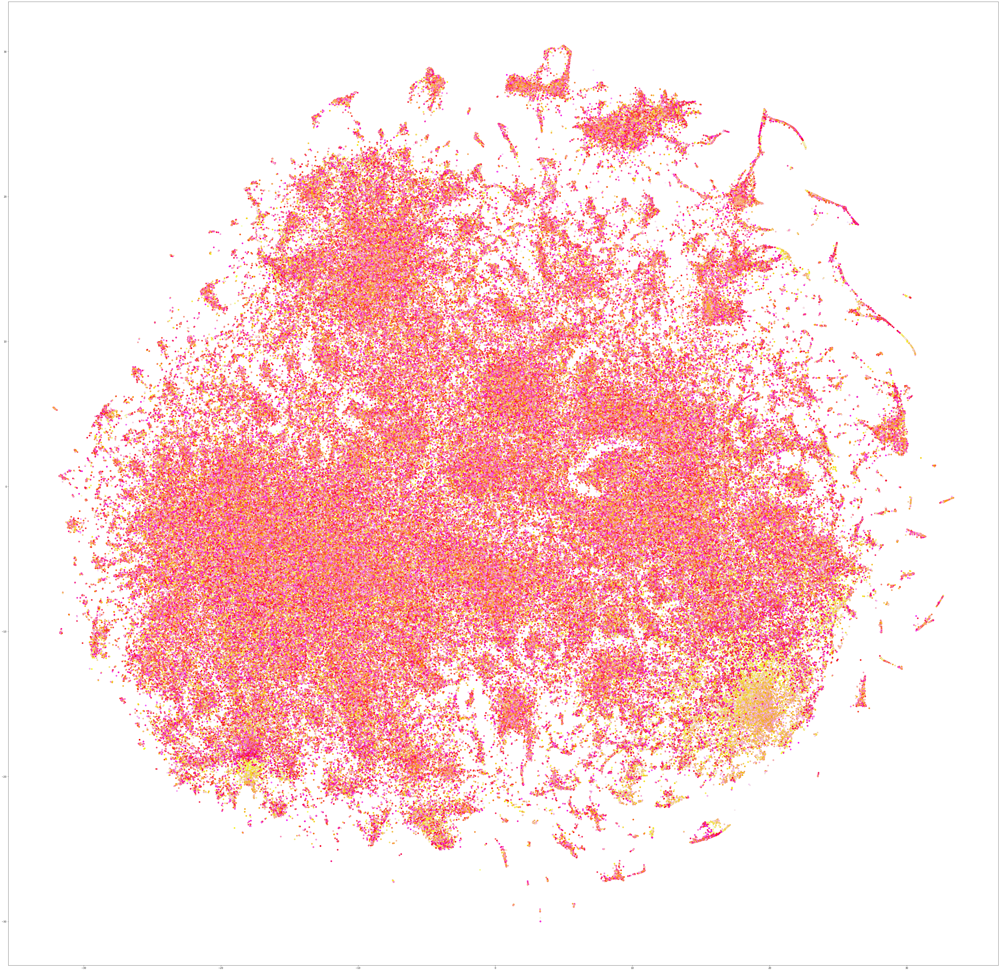

In [26]:
plt.figure(figsize=(75, 75))
plt.scatter(arrx,arry,c=colors[15900000:16300000]/255.0)
plt.show()

####Plotting the given words and their closest 20 points

In [27]:
#creating a dataframe containing only vectors of 63 points
frames = [closest_to_life,closest_to_market,closest_to_stanford]
temp = pd.concat(frames)
temp = np.asarray(temp)
all_closest = []
for x in temp:
  all_closest.append(np.asarray(all_words[x[0]]))

all_closest = pd.DataFrame(all_closest)

####Training TSE model and plotting it on a graph

In [28]:
closest_new_values = TSNE(perplexity = 5, learning_rate=10).fit_transform(all_closest)
all_closest['x'] = closest_new_values[:,0]
all_closest['y'] = closest_new_values[:,1]
tempax = np.asarray(all_closest['x'])
tempay = np.asarray(all_closest['y'])

In [29]:
#creating temp dataframe to plot different colored clusters
all_temp_closest = all_closest[['x', 'y']]

vals = []
for i in range(63):
  if(i < 21):
    vals.append('life')
  if(i >= 21 and i < 42):
    vals.append('market')
  if(i >= 42 and i < 63):
    vals.append('stanford')

vals = np.asarray(vals)

all_temp_closest.insert(2,"Names",vals,True)

all_temp_closest

,x,y,Names
0,21.240004,-1.306017,life
1,19.033859,-1.350326,life
2,20.540854,-2.827687,life
3,21.907724,-0.780299,life
4,15.655666,1.809553,life
...,...,...,...
58,-9.951573,-19.164499,stanford
59,-10.717322,-7.475436,stanford
60,-12.709599,-9.301509,stanford
61,-7.967784,-7.563139,stanford


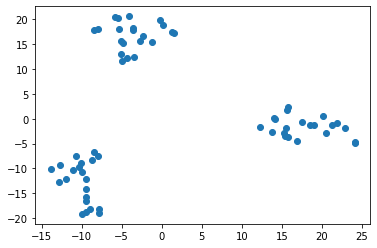

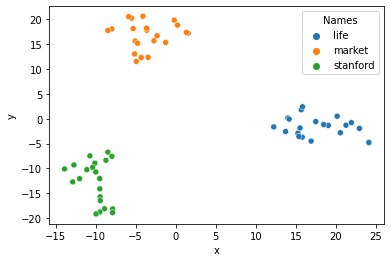

In [30]:
plt.scatter(tempax,tempay)
plt.show()

import seaborn as sns
sns.scatterplot(x = "x", y = "y", hue = "Names", data = all_temp_closest)


####Plotting words and their 20 neighbours seperately

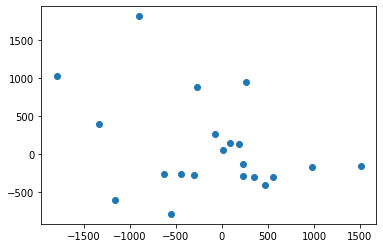

In [31]:
#LIFE
forlife = np.asarray(closest_to_life)
vec_life = []
for x in forlife:
  vec_life.append(np.asarray(all_words[x[0]]))

vec_life = pd.DataFrame(vec_life)

closest_new_values_life = TSNE(perplexity = 5).fit_transform(vec_life)

vec_life['x'] = closest_new_values_life[:,0]
vec_life['y'] = closest_new_values_life[:,1]

temp_sx = np.asarray(vec_life['x'])
temp_sy = np.asarray(vec_life['y'])

plt.scatter(temp_sx,temp_sy)
plt.show()

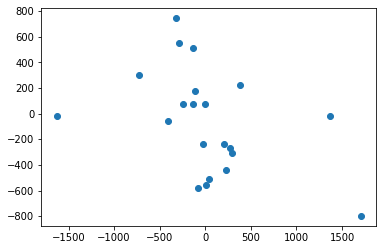

In [32]:
#MARKET
formarket = np.asarray(closest_to_market)
vec_market = []
for x in formarket:
  vec_market.append(np.asarray(all_words[x[0]]))

vec_market = pd.DataFrame(vec_market)

closest_new_values_market = TSNE(perplexity = 5).fit_transform(vec_market)

vec_market['x'] = closest_new_values_market[:,0]
vec_market['y'] = closest_new_values_market[:,1]

temp_sx = np.asarray(vec_market['x'])
temp_sy = np.asarray(vec_market['y'])

plt.scatter(temp_sx,temp_sy)
plt.show()

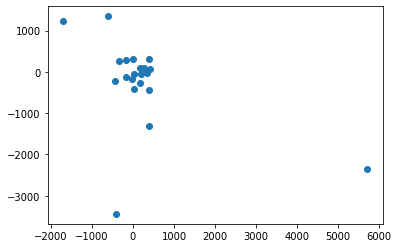

In [33]:
#STANFORD
forstanford = np.asarray(closest_to_stanford)
vec_stanford = []
for x in forstanford:
  vec_stanford.append(np.asarray(all_words[x[0]]))

vec_stanford = pd.DataFrame(vec_stanford)

closest_new_values_stanford = TSNE(perplexity = 5).fit_transform(vec_stanford)

vec_stanford['x'] = closest_new_values_stanford[:,0]
vec_stanford['y'] = closest_new_values_stanford[:,1]

temp_sx = np.asarray(vec_stanford['x'])
temp_sy = np.asarray(vec_stanford['y'])

plt.scatter(temp_sx,temp_sy)
plt.show()